# PCA from Scratch

```yaml
Course:   DS 5001
Module:   07 Lab
Topic:    PCA from Scratch
Author:   R.C. Alvarado
Date:     28 Februrary 2023 (revised)
```

**Purpose:**  To implement PCA from scratch and explore application to Austen-Melville corpus.

# Set Up

## Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [2]:
import plotly_express as px
import seaborn as sns

In [3]:
sns.set(style='ticks')

## Config

In [4]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
local_lib = config['DEFAULT']['local_lib']

In [5]:
data_prefix = 'austen-melville'

In [6]:
OHCO = ['book_id', 'chap_id']

In [7]:
# Added after class
norm_docs = True # This has the effect of exaggerating variance when False
center_term_vectors = True # This has the effect of demoting authorship when False

We pick a color map for our gradient visualizations. For more info on color maps, see the [Matplotlib docs](https://matplotlib.org/stable/tutorials/colors/colormaps.html) on the subject.

In [8]:
colors = "YlGnBu" 
# colors = "Spectral"

# Prepare the Data

## Import tables

In [9]:
LIB = pd.read_csv(f'{output_dir}/{data_prefix}-LIB_LABELS.csv').set_index('book_id')
VOCAB = pd.read_csv(f'{output_dir}/{data_prefix}-VOCAB2.csv').set_index('term_str')
BOW = pd.read_csv(f'{output_dir}/{data_prefix}-BOW-CHAPS.csv').set_index(OHCO+['term_str'])

In [10]:
VOCAB[['n','p','i']].head(20)

,n,p,i
term_str,,,
the,109921,0.053387,4.227375
of,65525,0.031824,4.973725
and,62954,0.030576,5.031473
to,56271,0.027330,5.193379
a,44174,0.021455,5.542573
in,36439,0.017698,5.820287
i,27280,0.013249,6.237927
was,24231,0.011769,6.408917
that,23670,0.011496,6.442711


## Generate reduced `TFIDF` table

We reduce the feature space of the the TFIDF table by selecting the top 1000 significant nouns, verbs, and adjectives.

Note that the `TFIDF` table is an extension of an implied `DOC` table, where each doc is a chapter in this case.

In [11]:
TFIDF = BOW['tfidf'].unstack(fill_value=0) 
VSHORT = VOCAB[VOCAB.max_pos.isin(['NN', 'VB', 'JJ'])].sort_values('dfidf', ascending=False).head(1000)
TFIDF = TFIDF[VSHORT.index]

In [12]:
TFIDF

term_str             sure     short      word       new      fine      name  \
book_id chap_id                                                               
105     1        0.000000  0.000000  0.000589  0.001180  0.000590  0.001161   
        2        0.000000  0.001537  0.000783  0.000000  0.000000  0.000000   
        3        0.001082  0.000535  0.000545  0.000000  0.000000  0.003761   
        4        0.000000  0.002522  0.000856  0.000000  0.000858  0.000844   
        5        0.001386  0.000000  0.000930  0.000933  0.000466  0.000000   
...                   ...       ...       ...       ...       ...       ...   
34970   110      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
        111      0.000000  0.000000  0.001426  0.000000  0.000000  0.000000   
        112      0.000000  0.000000  0.000000  0.000000  0.000000  0.002313   
        113      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
        114      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

term_str            sight      high    friend     rest  ...  solemn  leg  \
book_id chap_id                                         ...                
105     1        0.000000  0.001156  0.001799  0.00171  ...     0.0  0.0   
        2        0.000000  0.000769  0.000797  0.00000  ...     0.0  0.0   
        3        0.000542  0.002139  0.001110  0.00000  ...     0.0  0.0   
        4        0.000000  0.000000  0.000000  0.00000  ...     0.0  0.0   
        5        0.000000  0.000457  0.000474  0.00000  ...     0.0  0.0   
...                   ...       ...       ...      ...  ...     ...  ...   
34970   110      0.002338  0.002306  0.002392  0.00000  ...     0.0  0.0   
        111      0.000000  0.000000  0.000000  0.00000  ...     0.0  0.0   
        112      0.000000  0.000000  0.000000  0.00000  ...     0.0  0.0   
        113      0.000000  0.000000  0.000000  0.00000  ...     0.0  0.0   
        114      0.002385  0.000000  0.004881  0.00000  ...     0.0  0.0   

term_str         servants  fro  probability  infinite  woe  valley   willing  \
book_id chap_id                                                                
105     1        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        2        0.001952  0.0          0.0       0.0  0.0     0.0  0.000000   
        3        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        4        0.000000  0.0          0.0       0.0  0.0     0.0  0.002164   
        5        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
...                   ...  ...          ...       ...  ...     ...       ...   
34970   110      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        111      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        112      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        113      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        114      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   

term_str         brain  
book_id chap_id         
105     1          0.0  
        2          0.0  
        3          0.0  
        4          0.0  
        5          0.0  
...                ...  
34970   110        0.0  
        111        0.0  
        112        0.0  
        113        0.0  
        114        0.0  

[1185 rows x 1000 columns]

## Add some labels to `LIB`

In [13]:
genre_csv = """
105, domestic, romance
121, gothic, satire
141, domestic, satire
158, domestic, romance
161, domestic, romance
946, domestic, romance
1212, domestic, satire
1342, domestic, romance
1900, travel, adventure
2701, sea, adventure
4045, travel, adventure
8118, sea, adventure
10712, sea, critical
13720, sea, adventure
13721, sea, adventure
15422, historical, adventure
15859, mixed, mixed
21816, travel, satire
34970, gothic, psychological
53861, mixed, mixed
""".split('\n')[1:-1]
genre = pd.DataFrame([line.split(', ') for line in genre_csv], columns=['book_id','genre', 'mode'])
genre.book_id = genre.book_id.astype('int')
genre = genre.set_index('book_id')

In [14]:
LIB = pd.concat([LIB, genre], axis=1)

In [15]:
LIB_COLS = ['author','title', 'label', 'genre', 'mode']

In [16]:
LIB[LIB_COLS].head()

,author,title,label,genre,mode
book_id,,,,,
105,"AUSTEN, JANE",PERSUASION,Austen: Persuasion (105),domestic,romance
121,"AUSTEN, JANE",NORTHANGER ABBEY,Austen: Northanger Abbey (121),gothic,satire
141,"AUSTEN, JANE",MANSFIELD PARK,Austen: Mansfield Park (141),domestic,satire
158,"AUSTEN, JANE",EMMA,Austen: Emma (158),domestic,romance
161,"AUSTEN, JANE",SENSE AND SENSIBILITY,Austen: Sense And Sensibilit (161),domestic,romance


# Begin PCA Process

## Normalize doc vector lengths

We use L2 normalization, which scales documents by their pythagorean (Euclidean) length.

In [17]:
# TFIDF_L2 = (TFIDF.T / np.sqrt(np.square(TFIDF).sum(axis=1))).T
TFIDF_L2 = (TFIDF.T / norm(TFIDF, 2, axis=1)).T

In [18]:
TFIDF_L2

term_str             sure     short      word       new      fine      name  \
book_id chap_id                                                               
105     1        0.000000  0.000000  0.020872  0.041841  0.020921  0.041173   
        2        0.000000  0.046862  0.023866  0.000000  0.000000  0.000000   
        3        0.041590  0.020558  0.020939  0.000000  0.000000  0.144567   
        4        0.000000  0.081260  0.027589  0.000000  0.027653  0.027211   
        5        0.059816  0.000000  0.040153  0.040246  0.020123  0.000000   
...                   ...       ...       ...       ...       ...       ...   
34970   110      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
        111      0.000000  0.000000  0.032070  0.000000  0.000000  0.000000   
        112      0.000000  0.000000  0.000000  0.000000  0.000000  0.059148   
        113      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
        114      0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

term_str            sight      high    friend      rest  ...  solemn  leg  \
book_id chap_id                                          ...                
105     1        0.000000  0.040984  0.063781  0.060636  ...     0.0  0.0   
        2        0.000000  0.023431  0.024309  0.000000  ...     0.0  0.0   
        3        0.020843  0.082231  0.042656  0.000000  ...     0.0  0.0   
        4        0.000000  0.000000  0.000000  0.000000  ...     0.0  0.0   
        5        0.000000  0.019711  0.020450  0.000000  ...     0.0  0.0   
...                   ...       ...       ...       ...  ...     ...  ...   
34970   110      0.044688  0.044076  0.045728  0.000000  ...     0.0  0.0   
        111      0.000000  0.000000  0.000000  0.000000  ...     0.0  0.0   
        112      0.000000  0.000000  0.000000  0.000000  ...     0.0  0.0   
        113      0.000000  0.000000  0.000000  0.000000  ...     0.0  0.0   
        114      0.038429  0.000000  0.078647  0.000000  ...     0.0  0.0   

term_str         servants  fro  probability  infinite  woe  valley   willing  \
book_id chap_id                                                                
105     1        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        2        0.059507  0.0          0.0       0.0  0.0     0.0  0.000000   
        3        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        4        0.000000  0.0          0.0       0.0  0.0     0.0  0.069751   
        5        0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
...                   ...  ...          ...       ...  ...     ...       ...   
34970   110      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        111      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        112      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        113      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   
        114      0.000000  0.0          0.0       0.0  0.0     0.0  0.000000   

term_str         brain  
book_id chap_id         
105     1          0.0  
        2          0.0  
        3          0.0  
        4          0.0  
        5          0.0  
...                ...  
34970   110        0.0  
        111        0.0  
        112        0.0  
        113        0.0  
        114        0.0  

[1185 rows x 1000 columns]

Remove nulls ...

In [19]:
# TFIDF_L2.isnull().astype('int').T.sum().sort_values(ascending=False).head(20)

In [20]:
TFIDF_L2 = TFIDF_L2.dropna()

## Normalize term vector variance

We do **not** normalize variance, which we would normally do, such as with data containing divergent units of measure. \
This is because to do so would exaggerate the importance of rare words (see Ng, 2008: 6m40s–8m00s).

## Center the term vectors

We can take the column-wise means (the means for the _term_ vectors), but this alters the cosine angles between terms.

In [21]:
# TFIDF_L2 = TFIDF_L2 - TFIDF_L2.mean()

## Compute Covariance Matrix

$n = |X| = |Y|$

$Cov(X,Y) = \dfrac{\sum_{i=1}^{n} (x_i - \mu_X) (y_i - \mu_Y)}{n - 1} = \dfrac{XY}{n-1}$

We could we use the built in Pandas method here, but compute it ourselves.

In [22]:
COV = TFIDF_L2.cov() # This also centers the vectors
# COV = TFIDF_L2.T.dot(TFIDF_L2) / (TFIDF_L2.shape[0] - 1)

In [23]:
COV.head()

term_str,sure,short,word,new,fine,name,sight,high,friend,rest,...,solemn,leg,servants,fro,probability,infinite,woe,valley,willing,brain
term_str,,,,,,,,,,,,,,,,,,,,,
sure,0.001394,0.000140,0.000138,0.000014,0.000043,0.000091,-0.000037,-0.000052,0.000314,0.000046,...,0.000009,-0.000051,0.000114,-0.000065,0.000047,-0.000058,-6.992143e-05,-0.000095,0.000056,-0.000055
short,0.000140,0.000454,0.000072,-0.000014,0.000039,0.000023,-0.000009,0.000011,0.000169,0.000091,...,0.000023,-0.000016,0.000033,-0.000017,0.000012,-0.000034,-5.509710e-05,0.000090,0.000014,-0.000028
word,0.000138,0.000072,0.000607,0.000001,0.000026,0.000097,-0.000007,-0.000015,0.000128,0.000049,...,-0.000013,-0.000012,0.000037,-0.000009,0.000019,-0.000005,-3.025657e-05,-0.000015,0.000014,0.000003
new,0.000014,-0.000014,0.000001,0.001033,0.000114,0.000049,0.000041,0.000051,0.000084,0.000013,...,0.000021,-0.000018,-0.000008,0.000016,0.000004,0.000036,5.187549e-07,-0.000057,0.000005,0.000056
fine,0.000043,0.000039,0.000026,0.000114,0.000715,0.000058,0.000036,0.000054,0.000075,0.000010,...,0.000010,-0.000040,0.000059,-0.000014,-0.000025,-0.000020,-1.560336e-05,-0.000007,0.000007,-0.000035


## Decompose the Matrix

There a at least three options to choose from. We go with SciPy's Hermitian Eigendecomposition \
method `eigh()`, since our covarience matrix is symmetric.

In [24]:
from scipy.linalg import eigh

In [25]:
eig_vals, eig_vecs = eigh(COV)

## Convert eigen data to dataframes

In [26]:
EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
EIG_VAL.index.name = 'term_str'

In [27]:
EIG_VEC.iloc[:10, :10].style.background_gradient(cmap=colors)

term_str,sure,short,word,new,fine,name,sight,high,friend,rest
term_str,,,,,,,,,,
sure,-0.015697,-0.033820,0.036496,0.007564,-0.012835,0.016620,-0.019737,-0.044070,0.030306,0.015056
short,0.092153,-0.005341,-0.023006,-0.023067,-0.003340,-0.012432,-0.009334,0.009996,0.024220,0.046514
word,-0.018079,0.037908,0.009707,-0.038693,0.053304,0.001289,-0.001156,0.051275,0.011481,0.003384
new,0.004170,0.041908,-0.017271,0.005206,-0.031227,0.021507,0.013214,0.015576,-0.043227,0.007940
fine,0.004373,-0.015734,-0.049154,0.020473,-0.001250,-0.025279,0.065525,0.005406,-0.036074,0.071807
name,-0.006087,-0.014905,-0.050876,0.032641,0.010248,0.021091,-0.013640,0.020993,0.040239,-0.012366
sight,0.004964,-0.011058,-0.003028,-0.026649,-0.041894,-0.038291,0.043347,-0.012504,0.006154,0.005671
high,0.027953,0.045252,0.089885,0.019767,-0.013271,0.006683,0.025430,-0.058336,0.031806,-0.017877
friend,-0.013910,-0.020838,0.007792,-0.006523,0.007877,-0.038439,-0.043385,0.005168,0.008360,-0.016219


## Explore Term Pairs

In [28]:
EIG_VEC_PAIRS = EIG_VEC.stack().sort_values(ascending=False).to_frame('covariance')
EIG_VEC_PAIRS.index.names = ['term1', 'term2']

In [29]:
# EIG_VEC_PAIRS['label'] = EIG_VEC_PAIRS.apply(lambda x: '-'.join(x.name), axis=1)

In [30]:
EIG_VEC_PAIRS.head(20)

,,covariance
term1,term2,
whale,valley,0.786095
fish,nose,0.705507
doctor,fro,0.603433
ye,worlds,0.494431
jacket,material,0.469413
acquaintance,fault,0.388214
boat,dislike,0.377745
kings,other,0.341986
ball,imagination,0.340065


In [31]:
# px.scatter(EIG_VEC_PAIRS.sample(10000).sort_values('covariance'), y='label', x='covariance', height=1000)

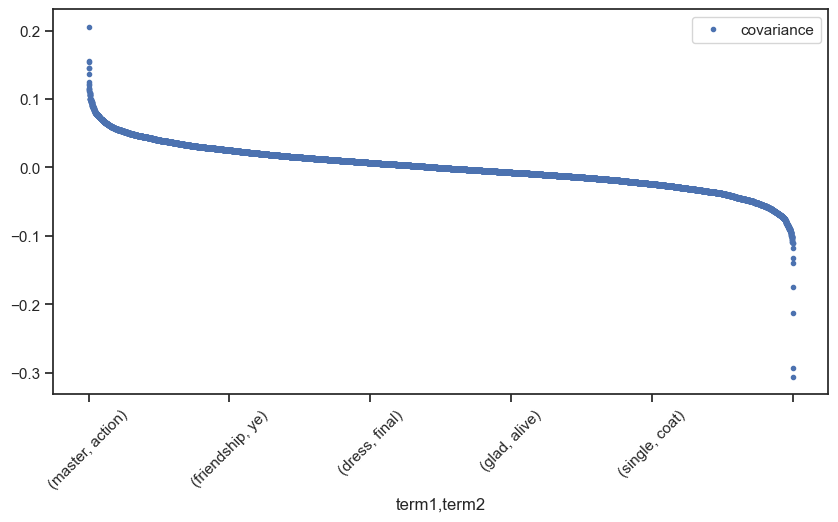

In [32]:
EIG_VEC_PAIRS.sample(10000).sort_values('covariance', ascending=False).plot(rot=45, style='.', figsize=(10,5));

## Select Principal Components

Next, we associate each eigenvalue with its corresponding *column* in the eigenvalue matrix. \
This is why we transpose the `EIG_VEC` dataframe.

## Combine eigenvalues and eignvectors

In [33]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [34]:
EIG_PAIRS.sort_values('eig_val', ascending=False).head(10)

,eig_val,sure,short,word,new,fine,name,sight,high,friend,...,solemn,leg,servants,fro,probability,infinite,woe,valley,willing,brain
term_str,,,,,,,,,,,,,,,,,,,,,
brain,0.044003,-0.092148,-0.028549,-0.022319,0.000860,-0.004910,-0.010426,0.019429,0.020933,-0.073952,...,-0.002331,0.024115,-0.025224,0.015866,-0.016252,0.002570,0.015949,0.015658,-0.012824,0.010184
willing,0.022903,0.015335,0.025196,0.009381,0.011100,0.022746,0.013175,0.022027,0.008835,0.022792,...,0.004360,-0.003914,-0.001130,0.000947,0.005053,-0.018676,-0.036069,0.020388,0.005706,-0.000693
valley,0.018800,0.026593,0.002133,0.007743,-0.013662,-0.015378,-0.007458,-0.007419,-0.008403,0.002087,...,-0.001314,0.010488,0.004527,-0.006875,0.007235,-0.002609,0.001674,-0.084364,-0.001132,0.020831
woe,0.014776,-0.039712,-0.012481,-0.028518,0.001083,-0.005490,-0.019511,-0.007979,0.008806,-0.027257,...,-0.000669,-0.032403,-0.008999,0.005087,-0.003816,0.008198,-0.004139,0.185069,-0.007621,0.020114
infinite,0.011365,-0.020345,-0.040368,-0.034374,-0.033100,-0.034391,-0.024402,-0.060562,-0.024229,-0.037881,...,-0.000837,-0.002263,-0.001697,-0.024187,0.003985,0.000547,-0.002546,-0.295768,-0.008381,0.014267
probability,0.009606,-0.057138,-0.011892,-0.036258,-0.045324,-0.043262,-0.012151,-0.016480,-0.026249,-0.072901,...,-0.005303,-0.060718,0.000028,-0.003341,0.010519,-0.001895,-0.014794,0.114719,-0.007603,-0.026750
fro,0.009297,0.000949,0.002391,0.006969,-0.026743,-0.020013,-0.017303,-0.025175,-0.041987,0.073288,...,-0.008951,0.036569,-0.008834,-0.013062,-0.001262,-0.018837,-0.017610,-0.181344,0.001133,-0.001687
servants,0.007994,-0.022046,0.004835,0.034084,0.021838,0.053143,0.026220,-0.021621,-0.010298,0.037851,...,0.006271,0.014063,-0.000107,-0.009158,-0.013142,0.008605,0.003175,0.051028,-0.003681,0.028764
leg,0.007366,0.002486,-0.020267,-0.003033,0.036828,-0.000562,-0.016849,0.032641,-0.011738,-0.013895,...,-0.000104,0.028411,0.008035,0.014061,-0.010833,0.017575,0.043019,-0.086340,-0.010351,0.002268


Next, we sort in descending order and pick the top K (=10).

## Compute and Show Explained Variance

We might have usd this value to sort our components.

In [35]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

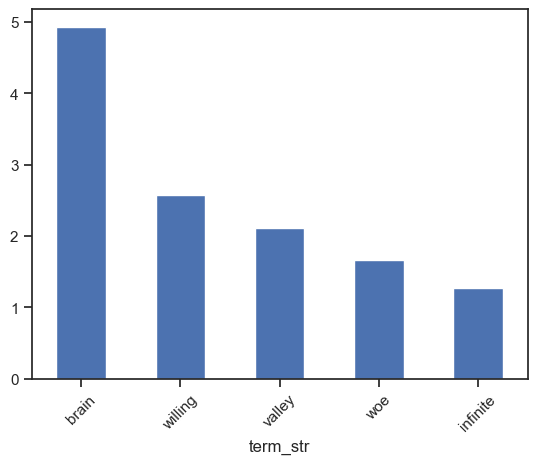

In [36]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45);

## Pick Top K (10) Components

We pick these based on explained variance.

In [37]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]
COMPS.index.name = 'pc_id'

In [38]:
COMPS

,eig_val,sure,short,word,new,fine,name,sight,high,friend,...,leg,servants,fro,probability,infinite,woe,valley,willing,brain,exp_var
pc_id,,,,,,,,,,,,,,,,,,,,,
PC0,0.044003,-0.092148,-0.028549,-0.022319,0.000860,-0.004910,-0.010426,0.019429,0.020933,-0.073952,...,0.024115,-0.025224,0.015866,-0.016252,0.002570,0.015949,0.015658,-0.012824,0.010184,4.93
PC1,0.022903,0.015335,0.025196,0.009381,0.011100,0.022746,0.013175,0.022027,0.008835,0.022792,...,-0.003914,-0.001130,0.000947,0.005053,-0.018676,-0.036069,0.020388,0.005706,-0.000693,2.57
PC2,0.018800,0.026593,0.002133,0.007743,-0.013662,-0.015378,-0.007458,-0.007419,-0.008403,0.002087,...,0.010488,0.004527,-0.006875,0.007235,-0.002609,0.001674,-0.084364,-0.001132,0.020831,2.11
PC3,0.014776,-0.039712,-0.012481,-0.028518,0.001083,-0.005490,-0.019511,-0.007979,0.008806,-0.027257,...,-0.032403,-0.008999,0.005087,-0.003816,0.008198,-0.004139,0.185069,-0.007621,0.020114,1.66
PC4,0.011365,-0.020345,-0.040368,-0.034374,-0.033100,-0.034391,-0.024402,-0.060562,-0.024229,-0.037881,...,-0.002263,-0.001697,-0.024187,0.003985,0.000547,-0.002546,-0.295768,-0.008381,0.014267,1.27
PC5,0.009606,-0.057138,-0.011892,-0.036258,-0.045324,-0.043262,-0.012151,-0.016480,-0.026249,-0.072901,...,-0.060718,0.000028,-0.003341,0.010519,-0.001895,-0.014794,0.114719,-0.007603,-0.026750,1.08
PC6,0.009297,0.000949,0.002391,0.006969,-0.026743,-0.020013,-0.017303,-0.025175,-0.041987,0.073288,...,0.036569,-0.008834,-0.013062,-0.001262,-0.018837,-0.017610,-0.181344,0.001133,-0.001687,1.04
PC7,0.007994,-0.022046,0.004835,0.034084,0.021838,0.053143,0.026220,-0.021621,-0.010298,0.037851,...,0.014063,-0.000107,-0.009158,-0.013142,0.008605,0.003175,0.051028,-0.003681,0.028764,0.90
PC8,0.007366,0.002486,-0.020267,-0.003033,0.036828,-0.000562,-0.016849,0.032641,-0.011738,-0.013895,...,0.028411,0.008035,0.014061,-0.010833,0.017575,0.043019,-0.086340,-0.010351,0.002268,0.83


In [39]:
# COMPS.iloc[:,1:-1].T.sort_values('PC1', ascending=False).head(10).index

## See Projected Components onto Vocabulary (Loadings)

Loadings sow the contribution of each term to the component. \
We'll just look at the topi 10 words for the first two components in the Book version.

In [40]:
LOADINGS = COMPS[COV.index].T
LOADINGS.index.name = 'term_str'

In [41]:
LOADINGS.head(10).style.background_gradient(cmap=colors)

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
sure,-0.092148,0.015335,0.026593,-0.039712,-0.020345,-0.057138,0.000949,-0.022046,0.002486,-0.034986
short,-0.028549,0.025196,0.002133,-0.012481,-0.040368,-0.011892,0.002391,0.004835,-0.020267,-0.001128
word,-0.022319,0.009381,0.007743,-0.028518,-0.034374,-0.036258,0.006969,0.034084,-0.003033,-0.000896
new,0.000860,0.011100,-0.013662,0.001083,-0.033100,-0.045324,-0.026743,0.021838,0.036828,0.055206
fine,-0.004910,0.022746,-0.015378,-0.005490,-0.034391,-0.043262,-0.020013,0.053143,-0.000562,0.020877
name,-0.010426,0.013175,-0.007458,-0.019511,-0.024402,-0.012151,-0.017303,0.026220,-0.016849,0.017196
sight,0.019429,0.022027,-0.007419,-0.007979,-0.060562,-0.016480,-0.025175,-0.021621,0.032641,0.020317
high,0.020933,0.008835,-0.008403,0.008806,-0.024229,-0.026249,-0.041987,-0.010298,-0.011738,0.008883
friend,-0.073952,0.022792,0.002087,-0.027257,-0.037881,-0.072901,0.073288,0.037851,-0.013895,0.030256


In [42]:
top_terms = []
for i in range(10):
    for j in [0, 1]:
        comp_str = ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())
        top_terms.append((f"PC{i}", j, comp_str))
COMP_GLOSS = pd.DataFrame(top_terms).set_index([0,1]).unstack()
COMP_GLOSS.index.name = 'comp_id'
COMP_GLOSS.columns = COMP_GLOSS.columns.droplevel(0) 
COMP_GLOSS = COMP_GLOSS.rename(columns={0:'pos', 1:'neg'})

In [43]:
COMP_GLOSS

1,pos,neg
comp_id,,
PC0,whale ship sea thou deck boat ye whales thee thy,sister dear think mother letter wish father ro...
PC1,ship whale deck boat mate ships sea war crew b...,thou thee thy art ye oh sweet lord brother mother
PC2,whale whales boat fish whaling thou line thee ...,doctor war island valley lord old deck frigate...
PC3,valley lord island whale fruit groves leaves f...,thou deck thee ship mate thy cabin ships crew ye
PC4,lord war jacket frigate gun wars top main bear...,valley doctor thou island house fruit trees bo...
PC5,valley thee mother doctor daughter marriage bo...,lord ye beard wine old oh think yes ay ah
PC6,doctor ye ghost confidence whats mate friend g...,valley war sea lord frigate land american wars...
PC7,war book american whale room bed whales man wa...,boat ye sea land lord sail isle breeze shore l...
PC8,bed room jacket book door white soul mother sl...,doctor lord war thou island thee american bear...


In [44]:
# COMPS.join(COMP_GLOSS)

## Project Docs onto Components

We get the dot product of the DTM matrix and the new component matrix, which we will call DCM -- for document-component matrix. \
This has the effect of replacing the features of the DTM with the features of the transposed component matrix.

In [45]:
# We use the index to get only PC features, so matrices align
DCM = TFIDF_L2.dot(COMPS[COV.index].T) 

We add metadata to our new, reduced matrices for display purposes.

In [46]:
DCM = DCM.join(LIB[LIB_COLS], on='book_id')

We define a `doc` field to name each chapter.

In [47]:
DCM['doc'] = DCM.apply(lambda x: f"{x.label} {str(x.name[1]).zfill(2)}", 1)

In [48]:
DCM.doc

book_id  chap_id
105      1                         Austen: Persuasion (105) 01
         2                         Austen: Persuasion (105) 02
         3                         Austen: Persuasion (105) 03
         4                         Austen: Persuasion (105) 04
         5                         Austen: Persuasion (105) 05
                                       ...                    
34970    110        Melville: Pierre Or The Ambigu (34970) 110
         111        Melville: Pierre Or The Ambigu (34970) 111
         112        Melville: Pierre Or The Ambigu (34970) 112
         113        Melville: Pierre Or The Ambigu (34970) 113
         114        Melville: Pierre Or The Ambigu (34970) 114
Name: doc, Length: 1174, dtype: object

In [49]:
DCM

PC0       PC1       PC2       PC3       PC4       PC5  \
book_id chap_id                                                               
105     1       -0.371046  0.061833  0.053048 -0.076647 -0.086028 -0.056283   
        2       -0.319113  0.071167  0.043493 -0.086668 -0.165096 -0.064710   
        3       -0.296830  0.108043  0.007387 -0.154286 -0.182573 -0.224041   
        4       -0.355427  0.061049  0.055275 -0.091065 -0.129187 -0.039282   
        5       -0.442728  0.110499  0.049399 -0.180118 -0.301091 -0.208578   
...                   ...       ...       ...       ...       ...       ...   
34970   110      0.137117 -0.297553  0.037890 -0.263005 -0.337217 -0.005284   
        111      0.013801 -0.296710  0.043473 -0.226435 -0.191843 -0.121772   
        112      0.018757 -0.062741 -0.033231 -0.106030 -0.165053 -0.084996   
        113      0.048841 -0.393805  0.054516 -0.230324 -0.160260 -0.108126   
        114      0.078267 -0.270576  0.001341 -0.287150 -0.210944 -0.102913   

                      PC6       PC7       PC8       PC9            author  \
book_id chap_id                                                             
105     1       -0.185400  0.049257 -0.071308  0.122766      AUSTEN, JANE   
        2       -0.133300  0.036311 -0.104476  0.058000      AUSTEN, JANE   
        3       -0.141347  0.097441 -0.086233  0.063916      AUSTEN, JANE   
        4       -0.160014  0.011318 -0.106639  0.127161      AUSTEN, JANE   
        5       -0.129206  0.061995 -0.050272 -0.003600      AUSTEN, JANE   
...                   ...       ...       ...       ...               ...   
34970   110     -0.152995 -0.072687 -0.082769  0.165273  MELVILLE, HERMAN   
        111     -0.030300  0.071904  0.023772  0.005582  MELVILLE, HERMAN   
        112     -0.092216  0.132520  0.084853  0.055838  MELVILLE, HERMAN   
        113     -0.056111  0.045343  0.022782 -0.005201  MELVILLE, HERMAN   
        114     -0.044992  0.097179 -0.003669  0.034826  MELVILLE, HERMAN   

                                     title  \
book_id chap_id                              
105     1                       PERSUASION   
        2                       PERSUASION   
        3                       PERSUASION   
        4                       PERSUASION   
        5                       PERSUASION   
...                                    ...   
34970   110      PIERRE OR THE AMBIGUITIES   
        111      PIERRE OR THE AMBIGUITIES   
        112      PIERRE OR THE AMBIGUITIES   
        113      PIERRE OR THE AMBIGUITIES   
        114      PIERRE OR THE AMBIGUITIES   

                                                  label     genre  \
book_id chap_id                                                     
105     1                      Austen: Persuasion (105)  domestic   
        2                      Austen: Persuasion (105)  domestic   
        3                      Austen: Persuasion (105)  domestic   
        4                      Austen: Persuasion (105)  domestic   
        5                      Austen: Persuasion (105)  domestic   
...                                                 ...       ...   
34970   110      Melville: Pierre Or The Ambigu (34970)    gothic   
        111      Melville: Pierre Or The Ambigu (34970)    gothic   
        112      Melville: Pierre Or The Ambigu (34970)    gothic   
        113      Melville: Pierre Or The Ambigu (34970)    gothic   
        114      Melville: Pierre Or The Ambigu (34970)    gothic   

                          mode                                         doc  
book_id chap_id                                                             
105     1              romance                 Austen: Persuasion (105) 01  
        2              romance                 Austen: Persuasion (105) 02  
        3              romance                 Austen: Persuasion (105) 03  
        4              romance                 Austen: Persuasion (105) 04  
        5              romance   

# Visualize

In [50]:
def vis_pcs(M, a, b, label='author', hover_name='doc', symbol=None, size=None):
    return px.scatter(M, f"PC{a}", f"PC{b}", color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

In [51]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    X = LOADINGS.join(VOCAB)
    return px.scatter(X.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', size='i', color='max_pos', 
                      marginal_x='box', height=800)

## PC 0 and 1

### Author

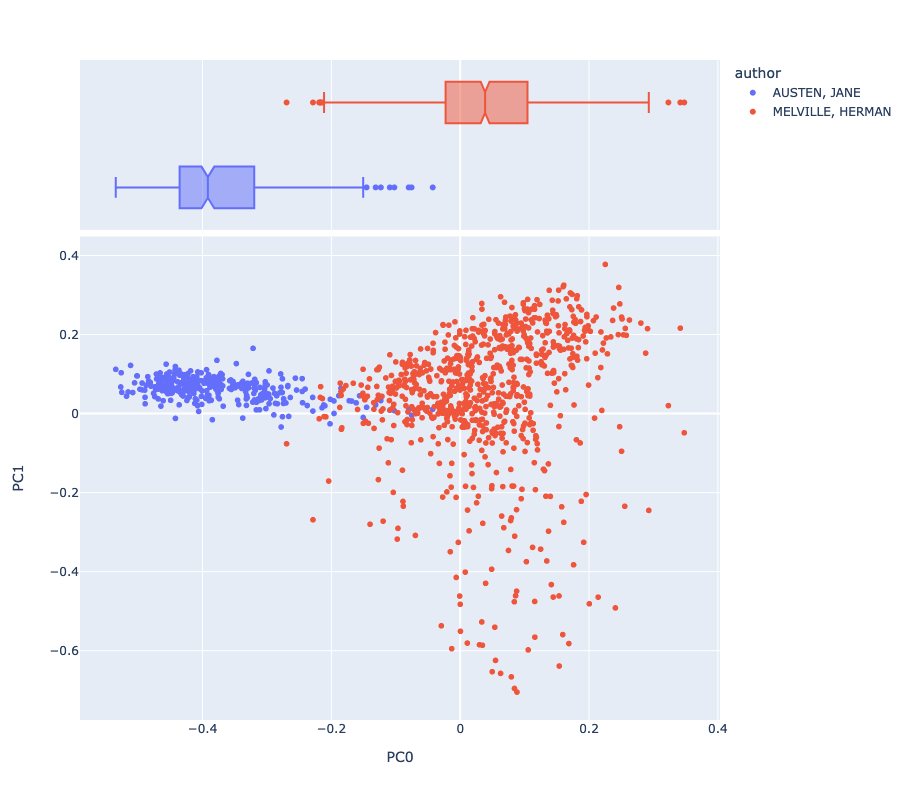

In [52]:
vis_pcs(DCM, 0, 1)

### Loadings

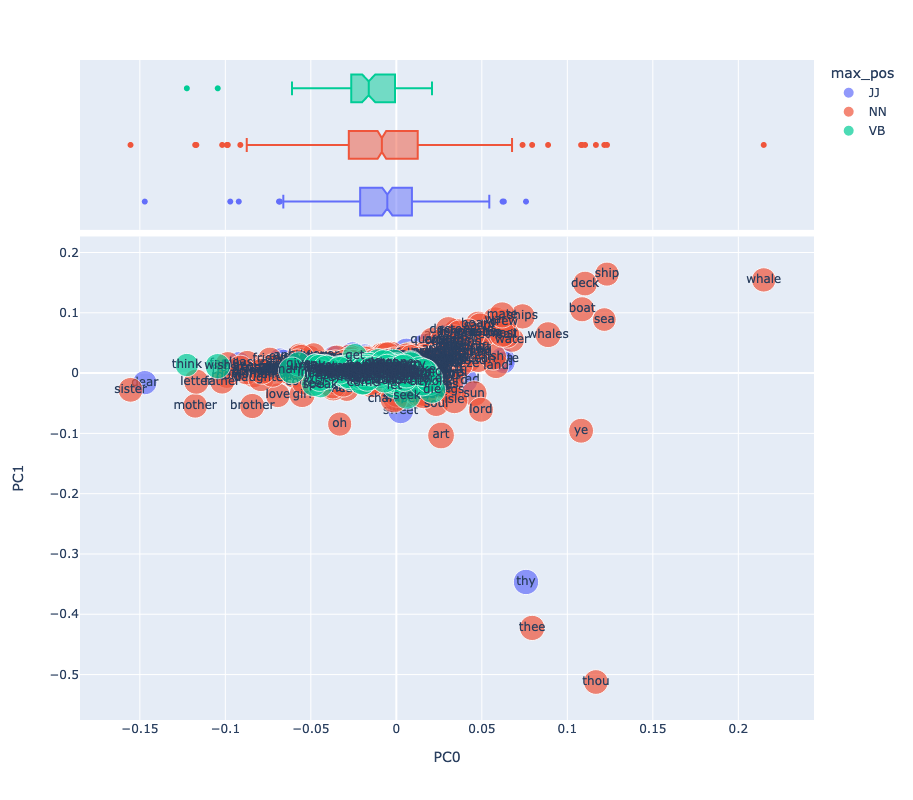

In [53]:
vis_loadings(0,1)

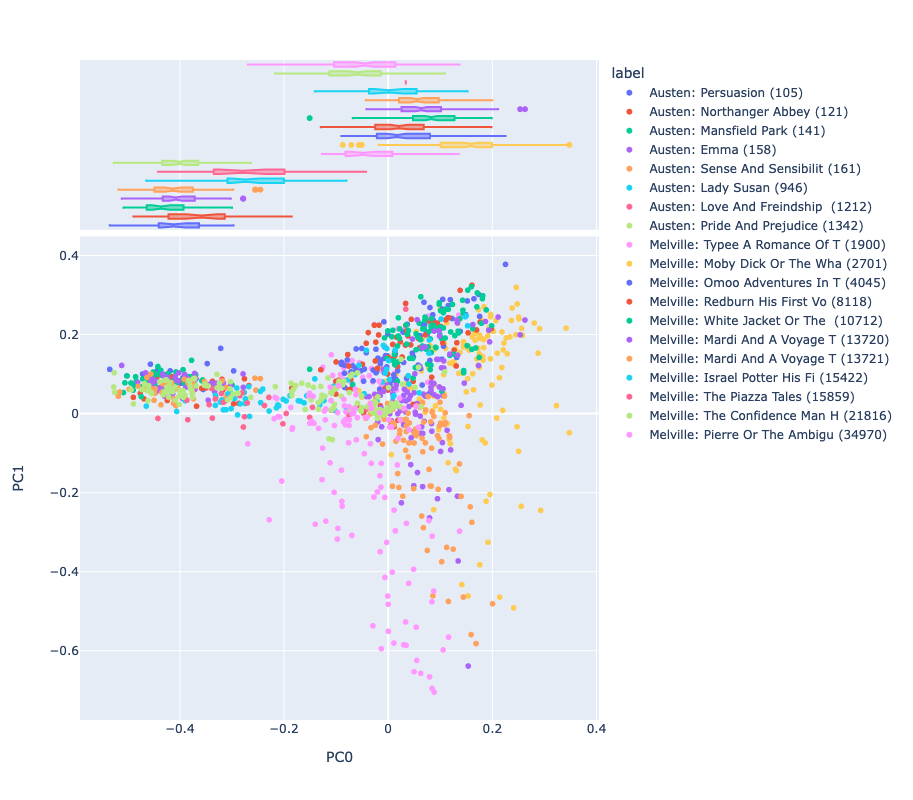

In [54]:
vis_pcs(DCM, 0, 1, label='label')

### Genre

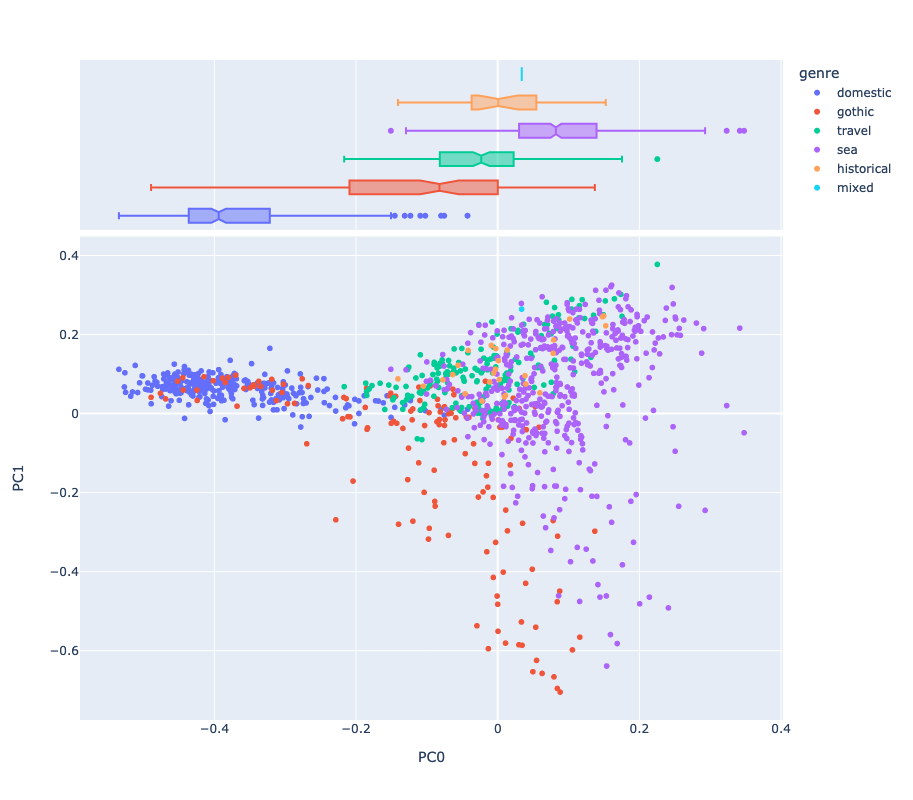

In [55]:
vis_pcs(DCM, 0, 1, label='genre')

### Mode

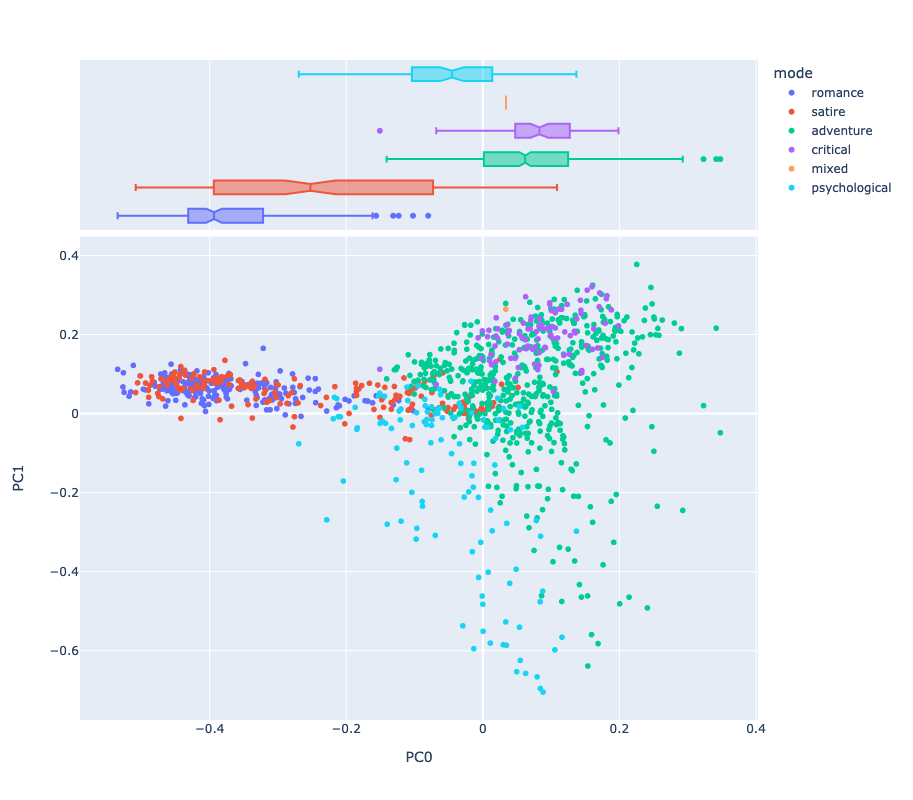

In [56]:
vis_pcs(DCM, 0, 1, label='mode')

### Title

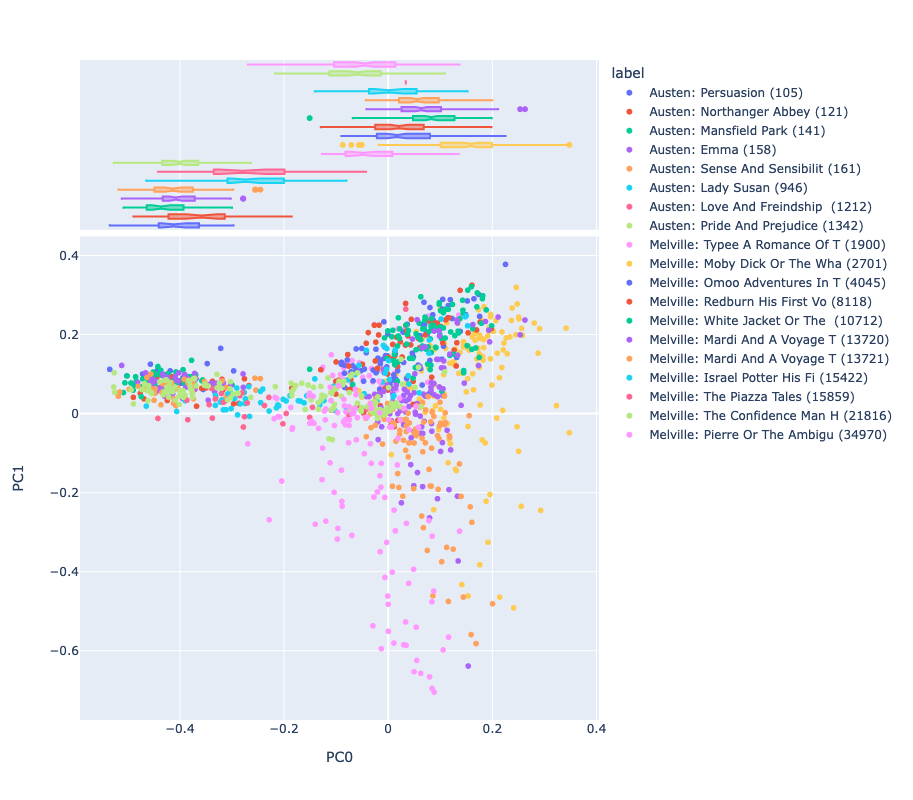

In [57]:
vis_pcs(DCM, 0, 1, label='label')

## PC 1 and 2

### Author

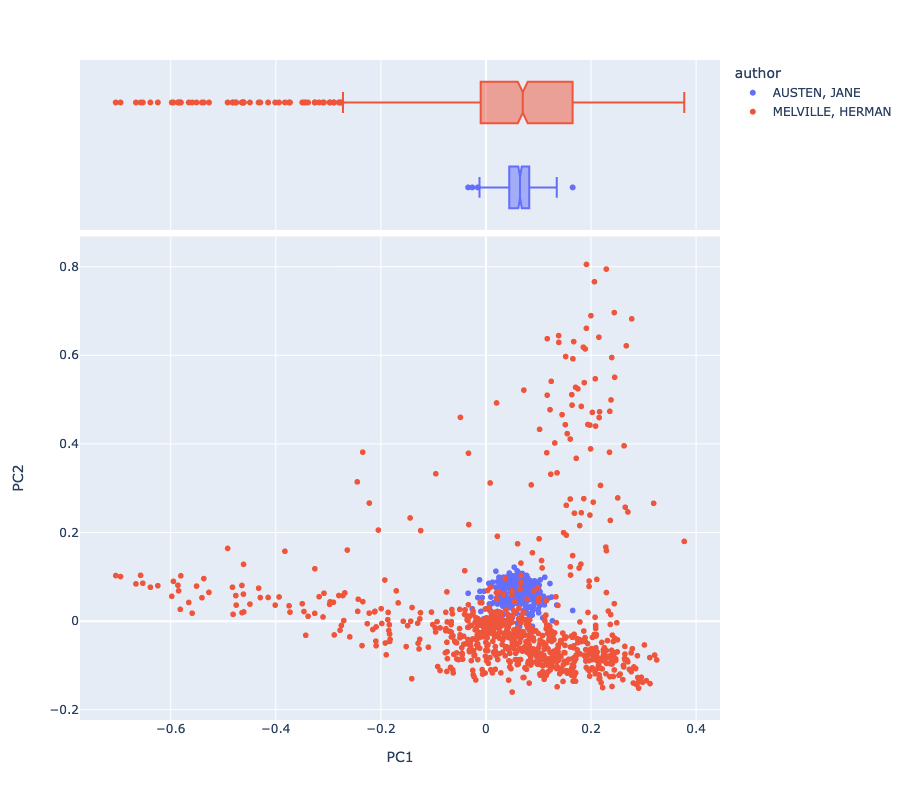

In [58]:
vis_pcs(DCM, 1, 2)

### Loadings

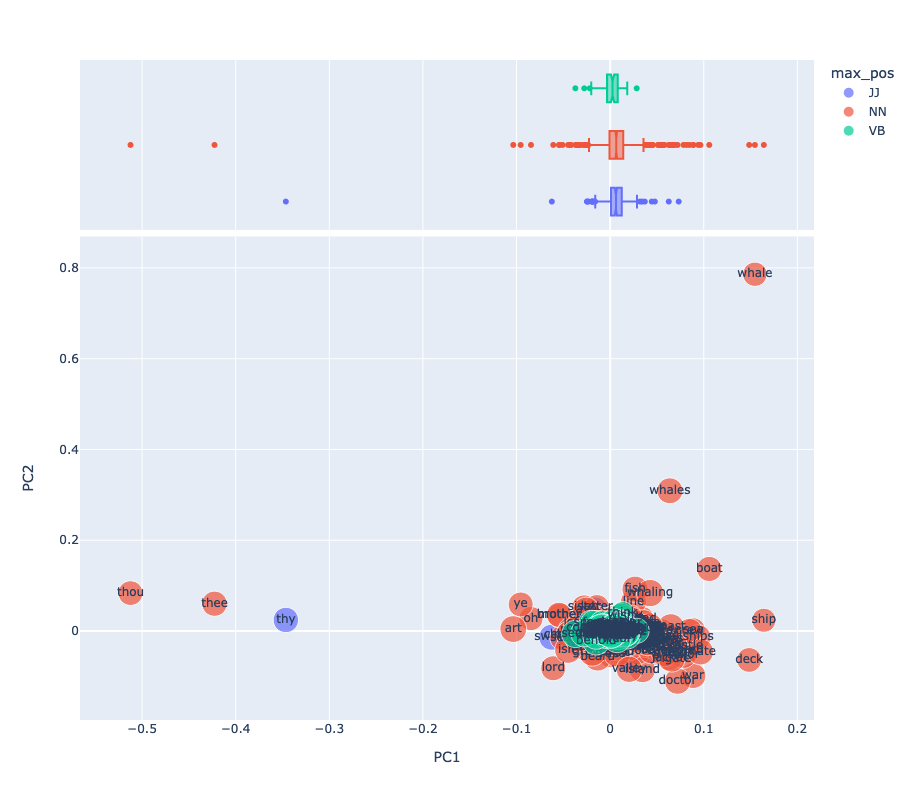

In [59]:
vis_loadings(1, 2)

### Genre

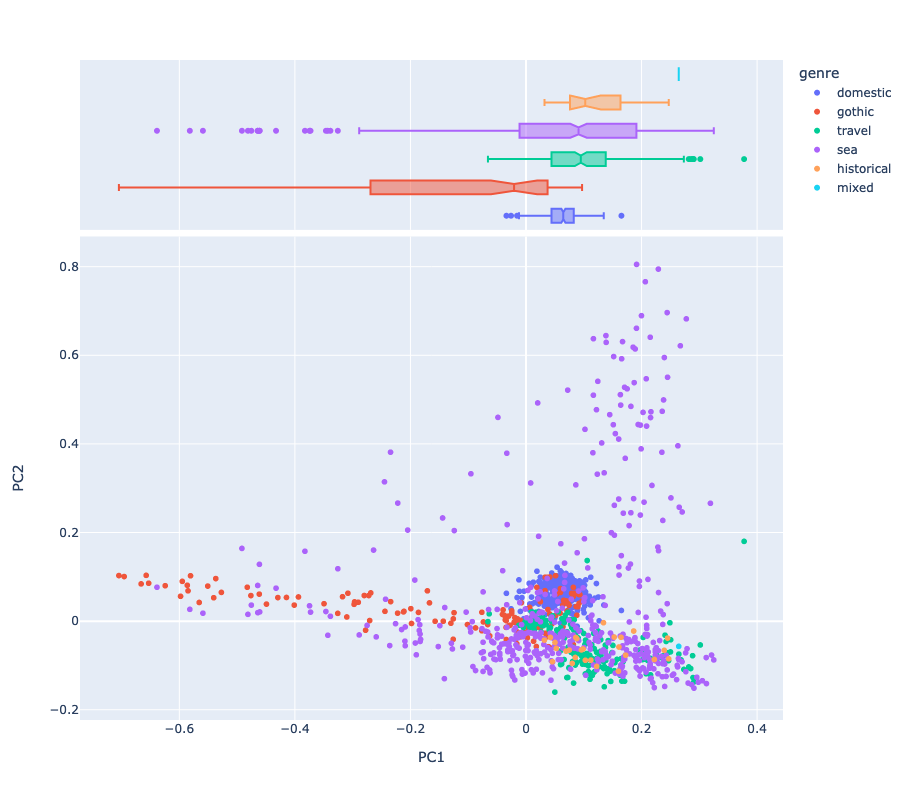

In [60]:
vis_pcs(DCM, 1, 2, label='genre')

### Mode

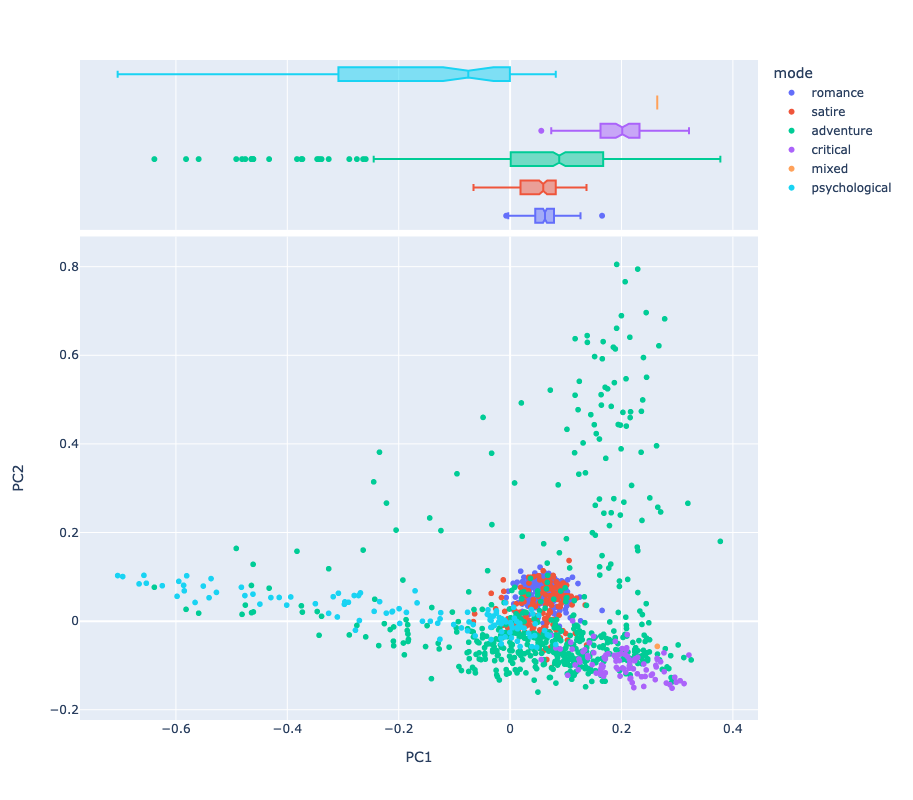

In [61]:
vis_pcs(DCM, 1, 2, label='mode')

### Title

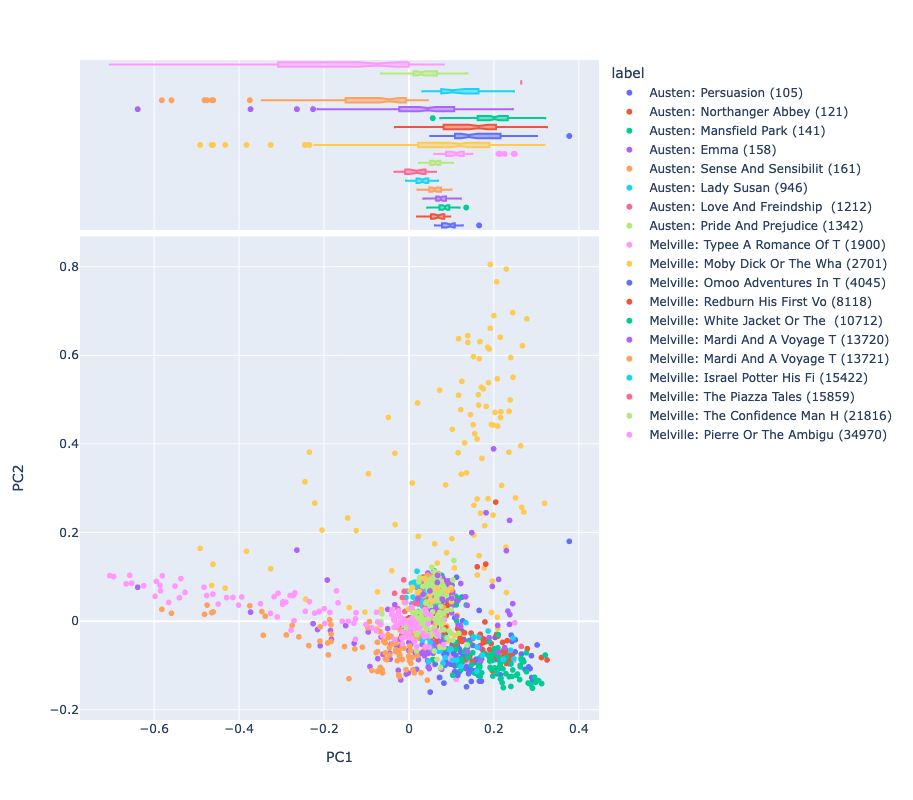

In [62]:
vis_pcs(DCM, 1, 2, label='label')

## PC 2 and 3

### Author

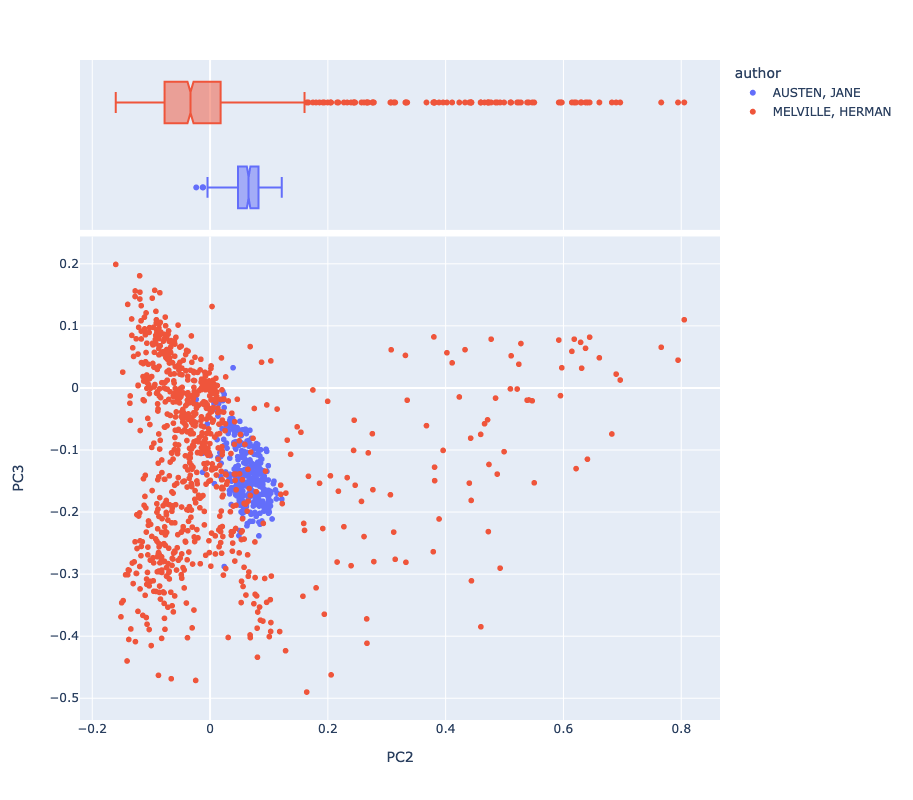

In [63]:
vis_pcs(DCM, 2, 3)

### Loadings

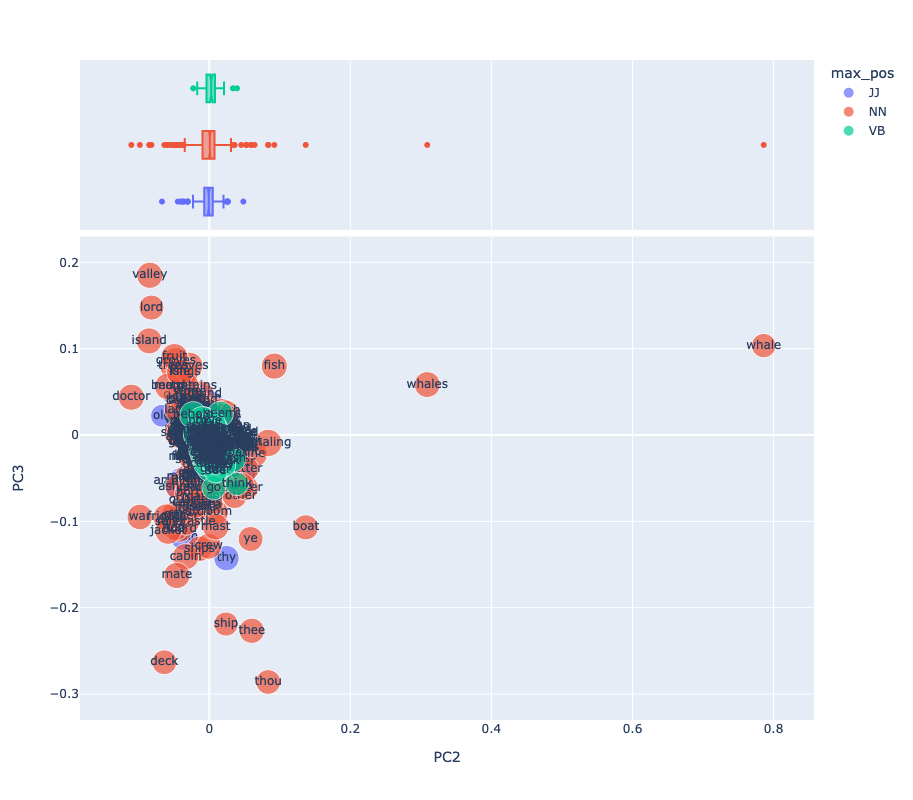

In [64]:
vis_loadings(2, 3)

### Genre

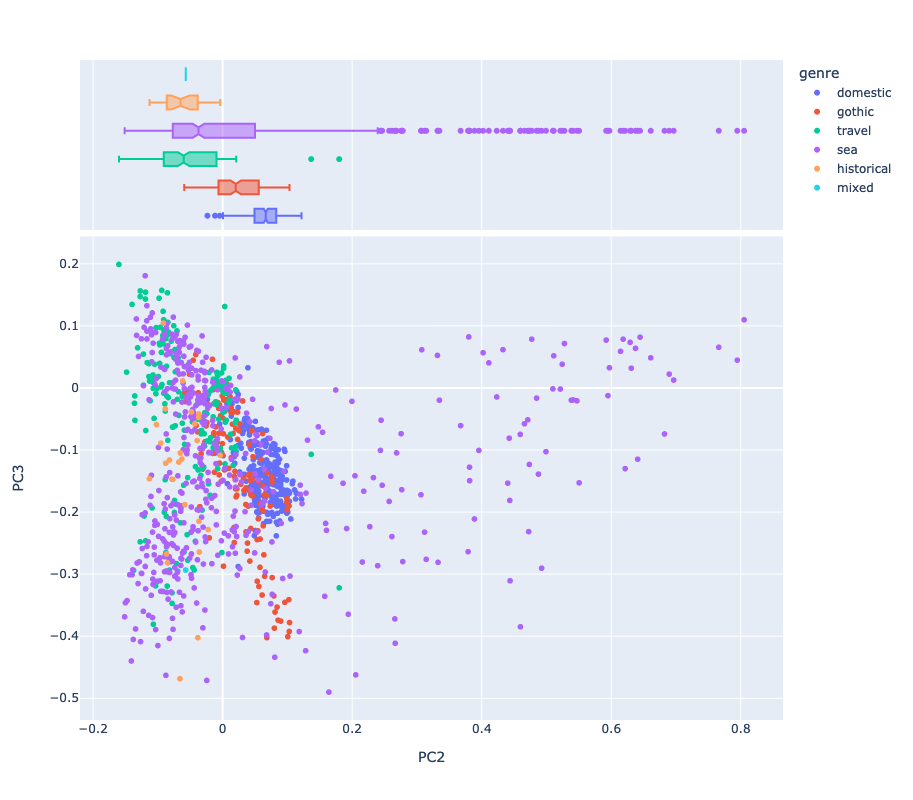

In [65]:
vis_pcs(DCM, 2, 3, label='genre')

### Mode

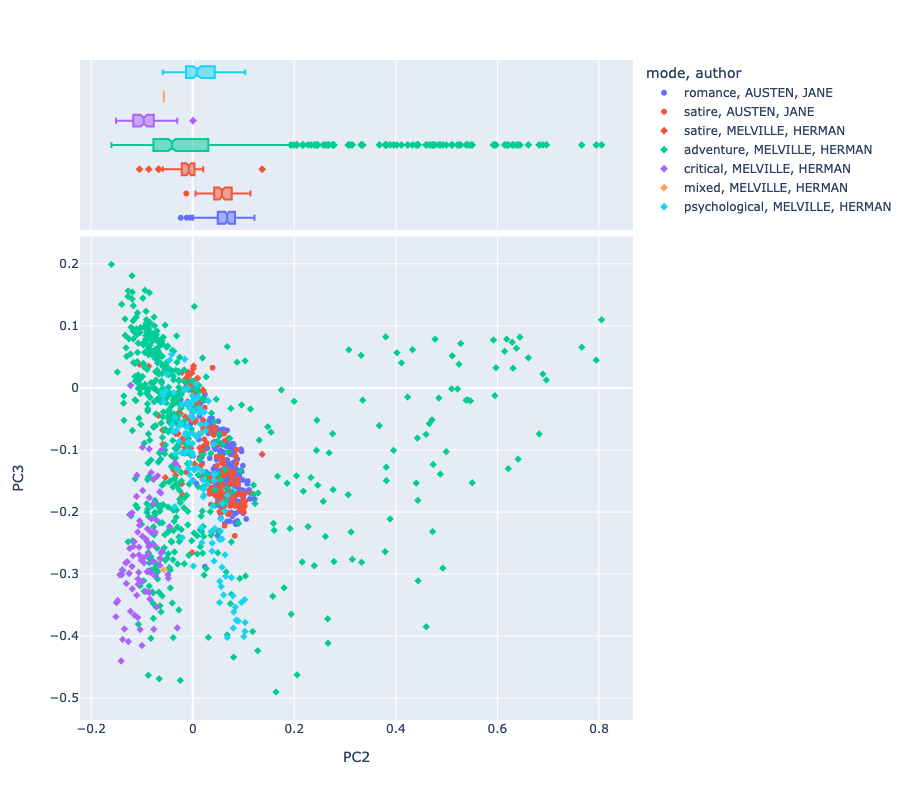

In [66]:
vis_pcs(DCM, 2, 3, label='mode', symbol='author')

### Title

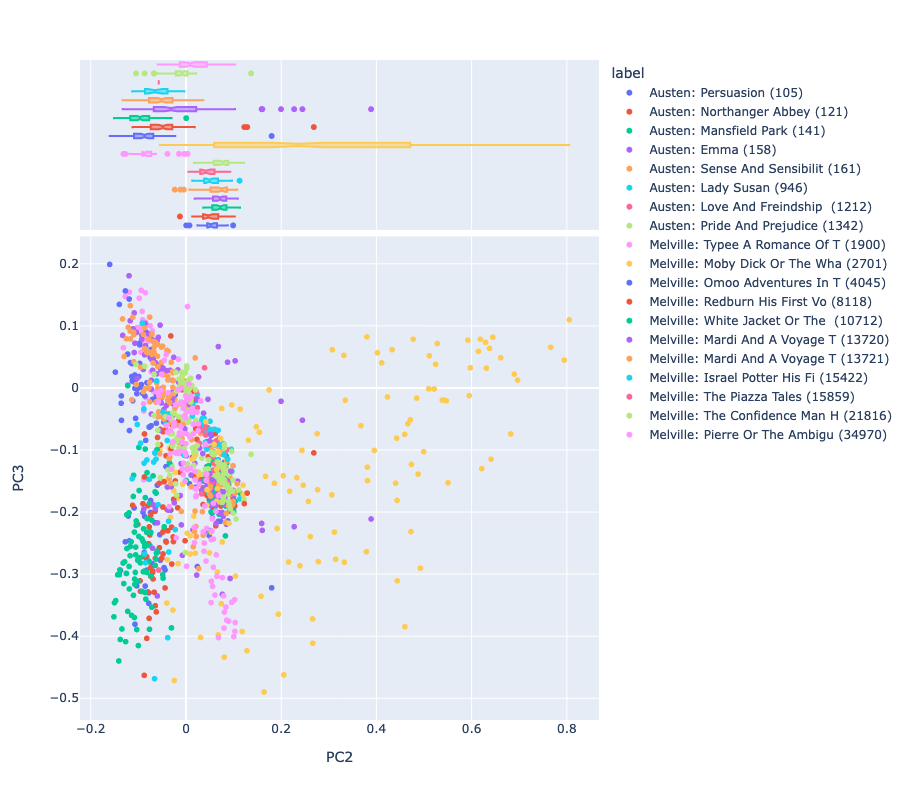

In [67]:
vis_pcs(DCM, 2, 3, label='label')

## PC 3 and 4

### Author

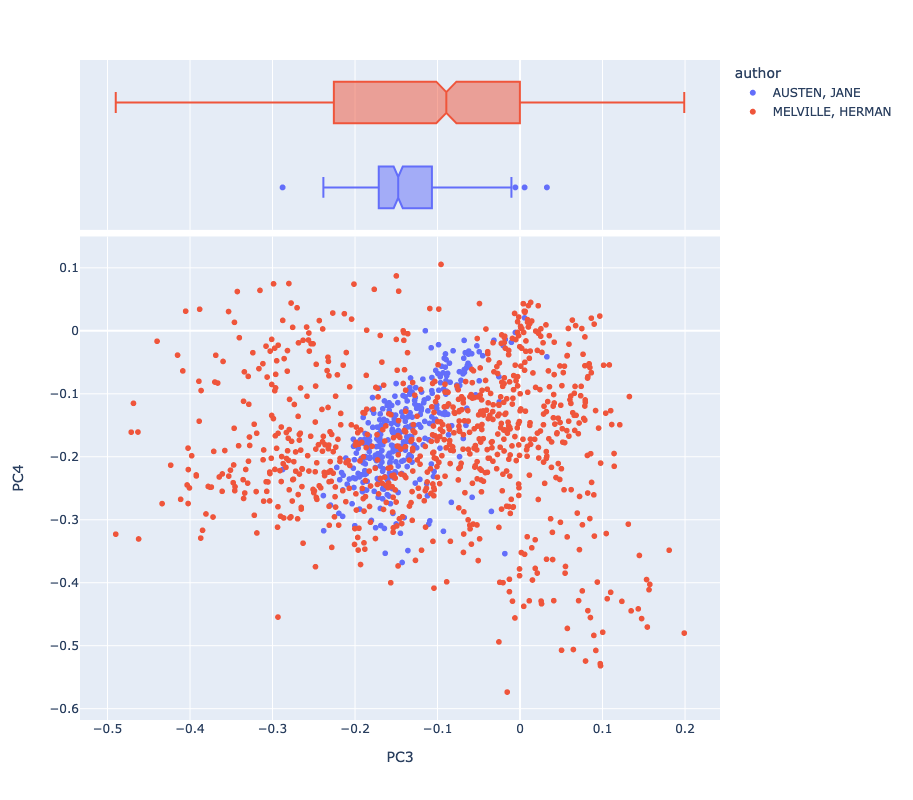

In [68]:
vis_pcs(DCM, 3, 4, label='author')

### Loadings

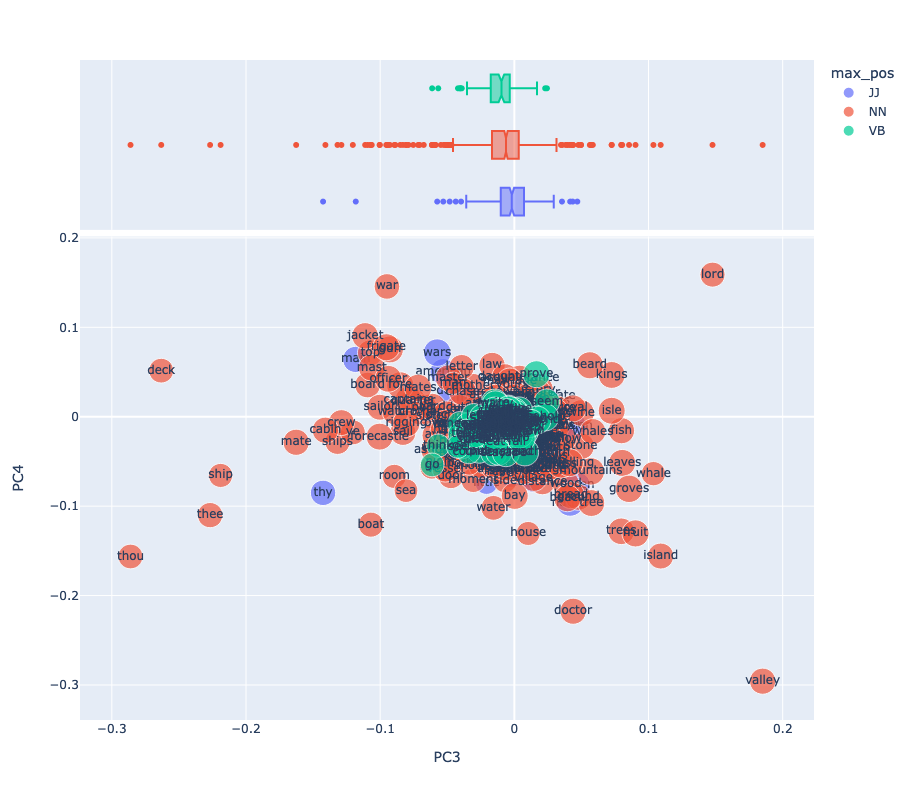

In [69]:
vis_loadings(3, 4)

### Genre

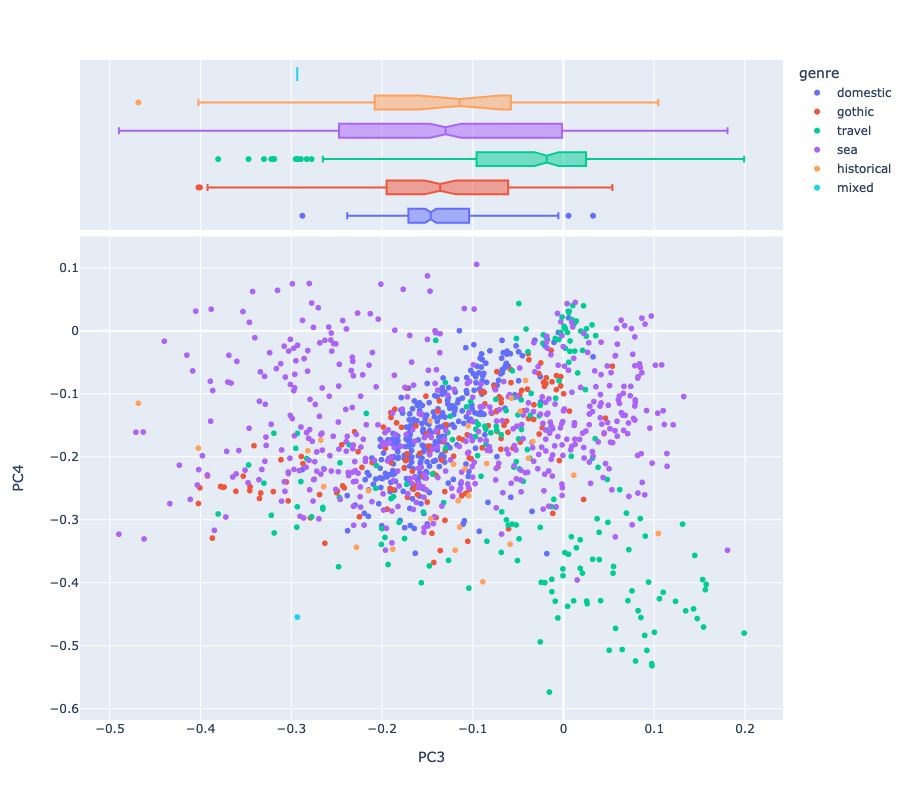

In [70]:
vis_pcs(DCM, 3, 4, label='genre')

### Mode

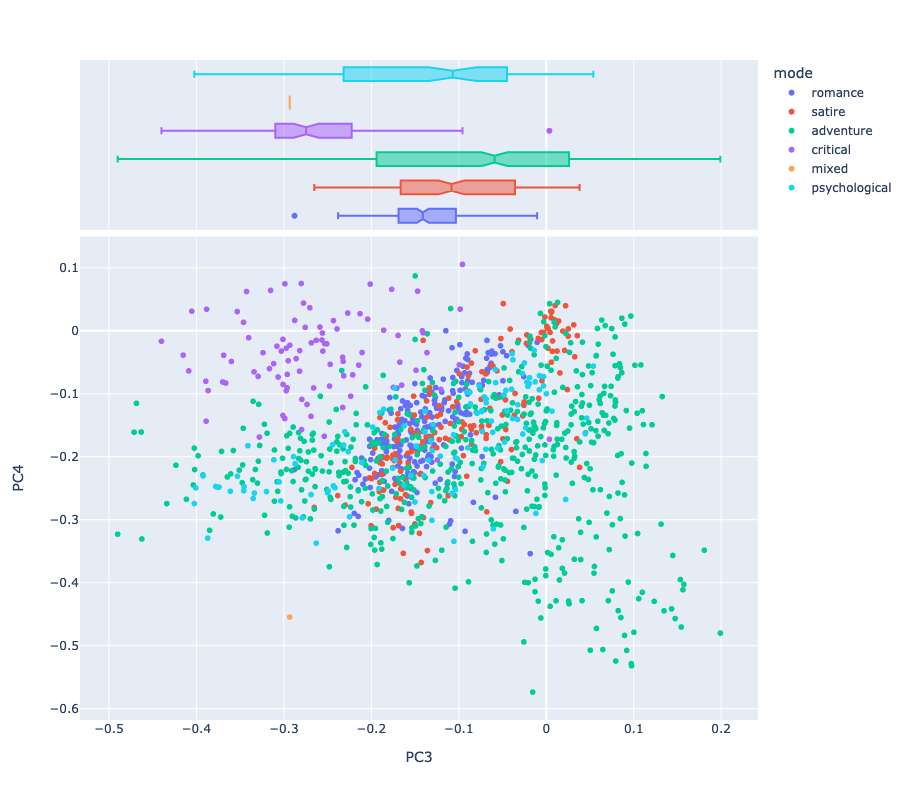

In [71]:
vis_pcs(DCM, 3, 4, label='mode')

### Title

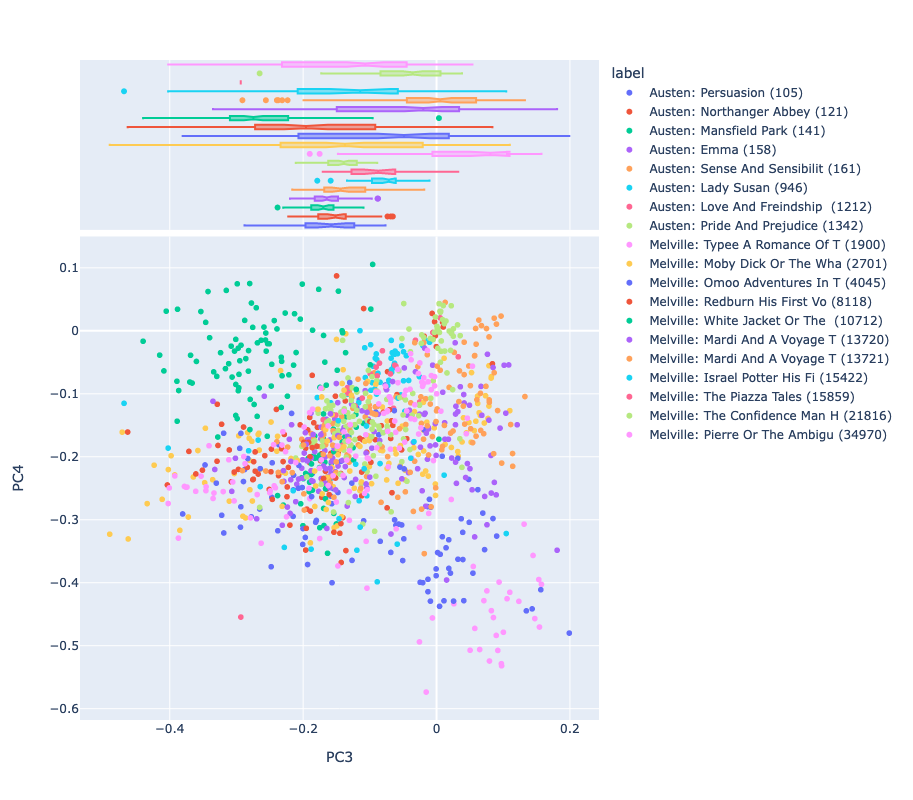

In [72]:
vis_pcs(DCM, 3, 4, label='label')

## Dendrograms

In [102]:
import plotly.figure_factory as ff
from plotly.figure_factory import create_dendrogram # Built on top of SciPy

In [74]:
import sys
sys.path.append(local_lib)
from hac import HAC

In [75]:
X = DCM[COMPS.index].groupby('book_id').mean()
titles = LIB.loc[list(X.index)].apply(lambda x: x.label + ' ' + x.genre.upper(), 1)
X.index = titles

<Axes: >

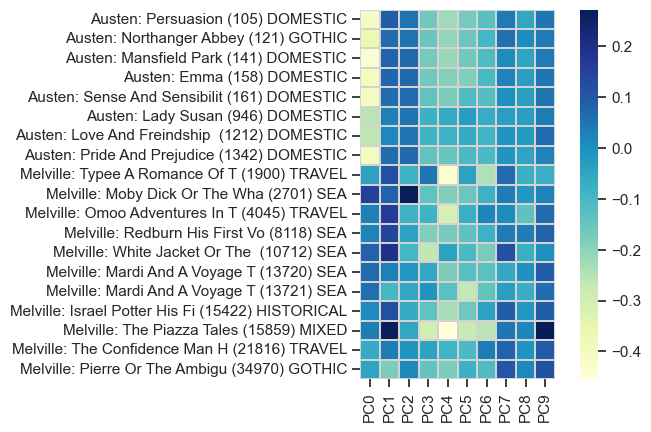

In [76]:
sns.heatmap(X, cmap='YlGnBu', square=True, linewidths=.01, linecolor='lightgray')

In [77]:
# X.style.background_gradient(cmap=colors)

<Figure size 640x480 with 0 Axes>

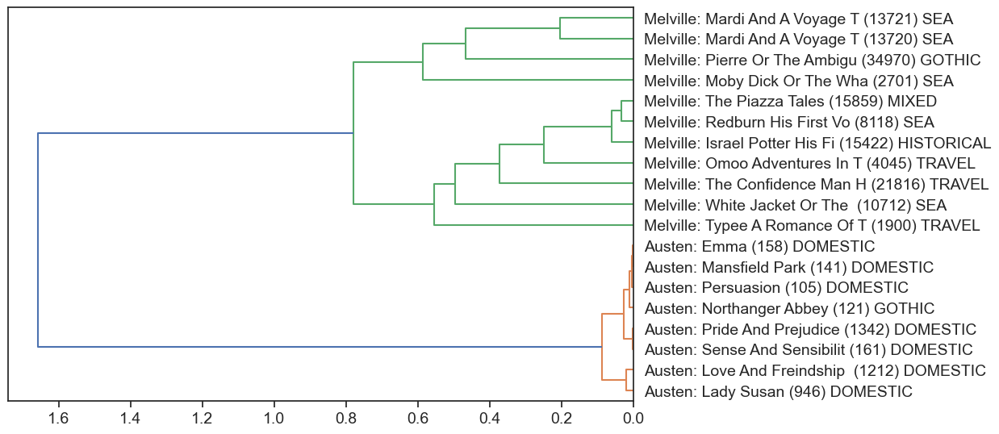

In [78]:
HAC(X).plot();

In [79]:
# fig = create_dendrogram(X, labels=X.index, orientation='left', color_threshold=.3)
# fig.update_layout(width=1000, height=800)
# fig.show()

In [80]:
XV = LOADINGS.loc[VSHORT.sort_values('dfidf', ascending=False).head(100).index]

<Figure size 640x480 with 0 Axes>

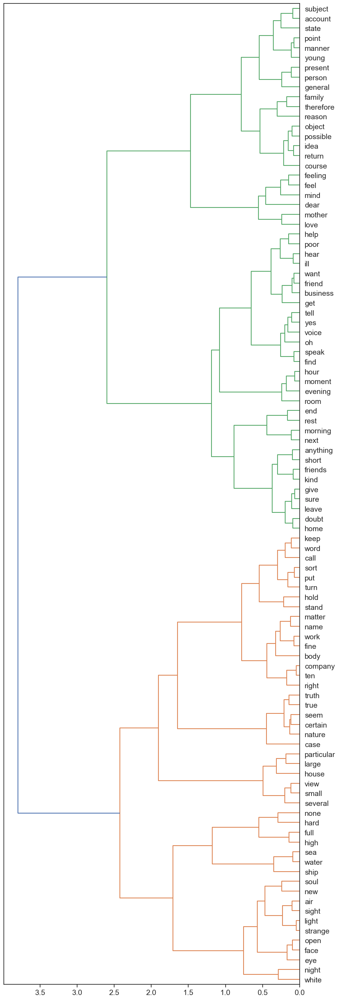

In [81]:
HAC(XV).plot()

In [82]:
# fig = create_dendrogram(XV, labels=XV.index, orientation='left', color_threshold=.05)
# fig.update_layout(width=1000, height=1200)
# fig.show()

In [83]:
XV2 = LOADINGS.loc[VSHORT.sample(50).index]

<Figure size 640x480 with 0 Axes>

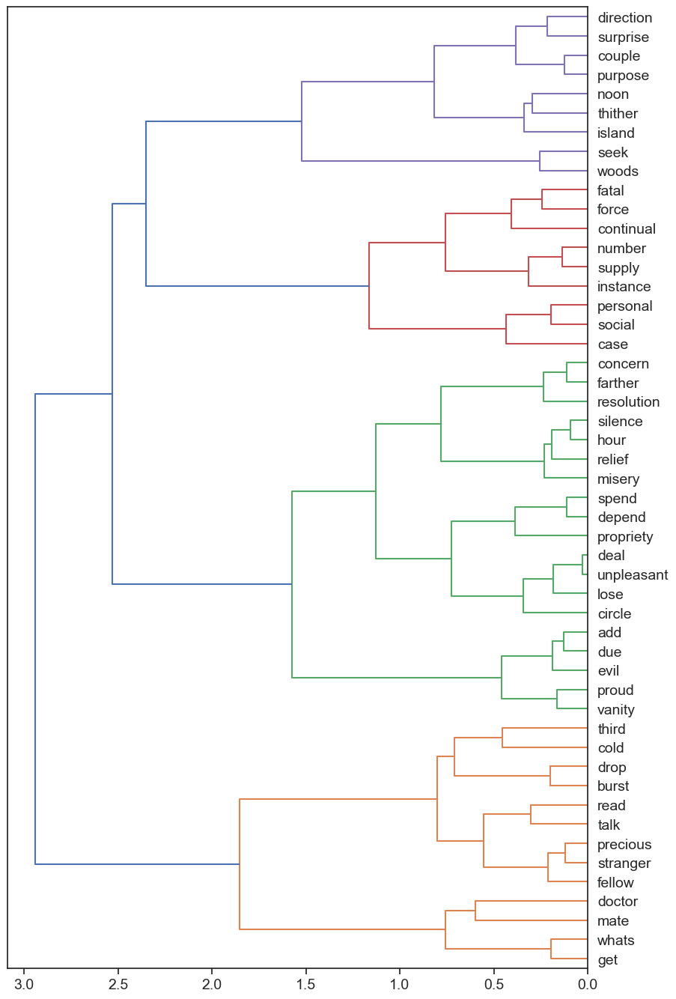

In [84]:
HAC(XV2).plot()

In [85]:
# fig = create_dendrogram(XV2, labels=XV2.index, orientation='left', color_threshold=.05)
# fig.update_layout(width=1000, height=1200)
# fig.show()

# Compare to Scikit Learn

In [86]:
pca_engine = PCA(n_components=10)

In [87]:
DCM_sk = pd.DataFrame(pca_engine.fit_transform(TFIDF_L2.fillna(0)), index=TFIDF_L2.index)

In [88]:
DCM_sk.columns = ['PC{}'.format(i) for i in DCM_sk.columns]
DCM_sk = DCM_sk.join(LIB[LIB_COLS], on='book_id')
DCM_sk['doc'] = DCM_sk.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [89]:
DCM_sk.iloc[:10, :10].style.background_gradient(cmap=colors)

## PC 0 and 1

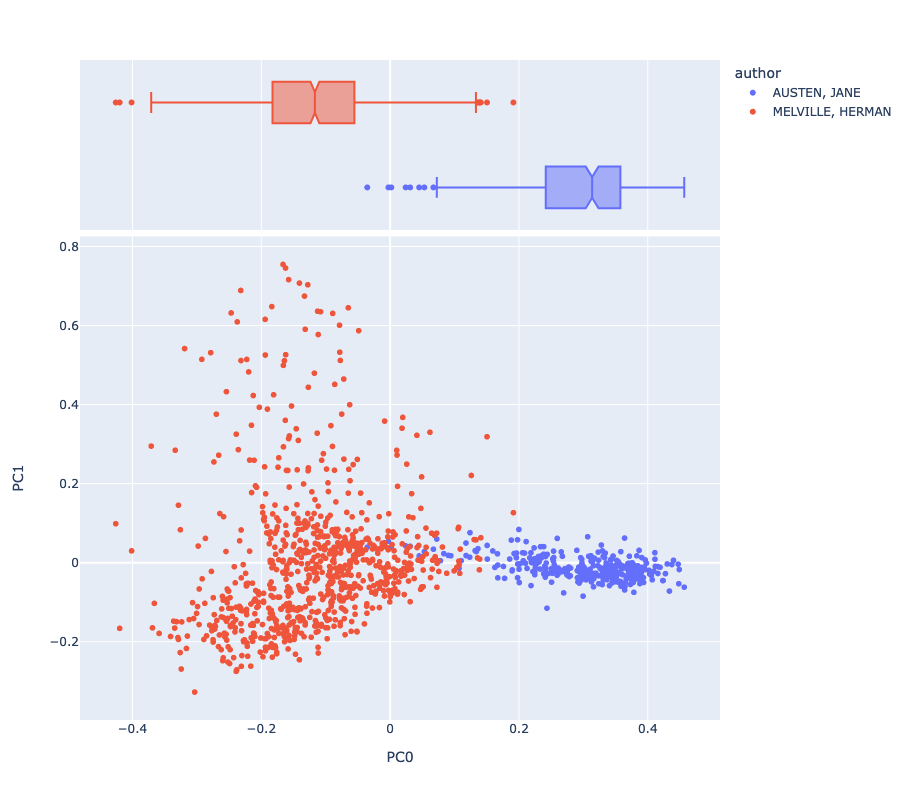

In [90]:
vis_pcs(DCM_sk, 0, 1)

## PC 1 and 2

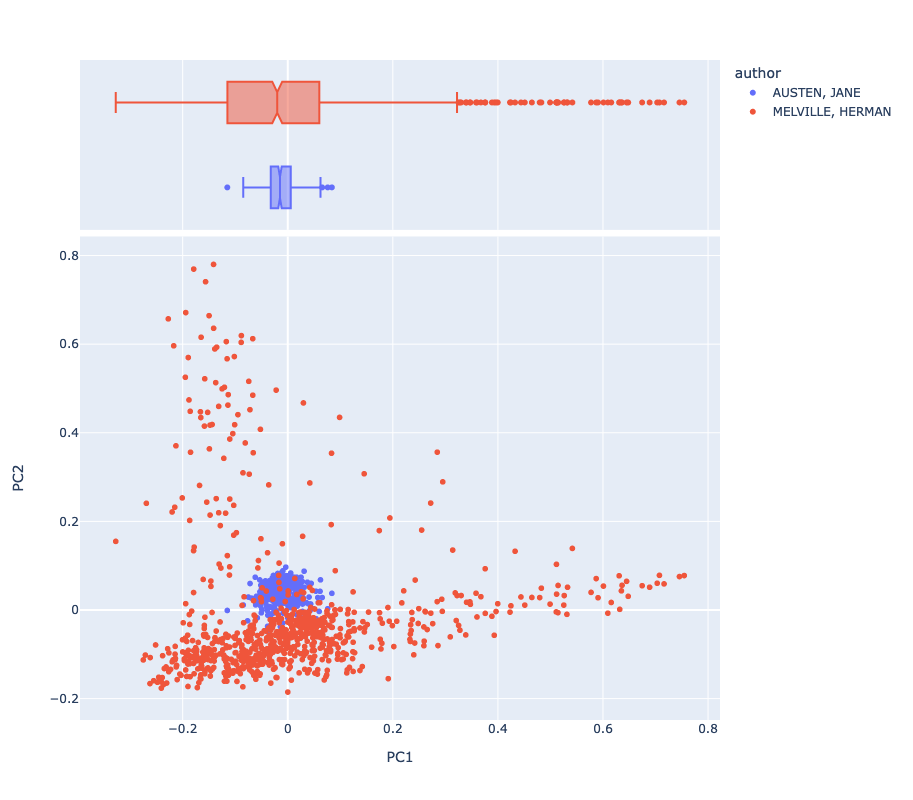

In [91]:
vis_pcs(DCM_sk, 1, 2)

##  PC 2 and 3

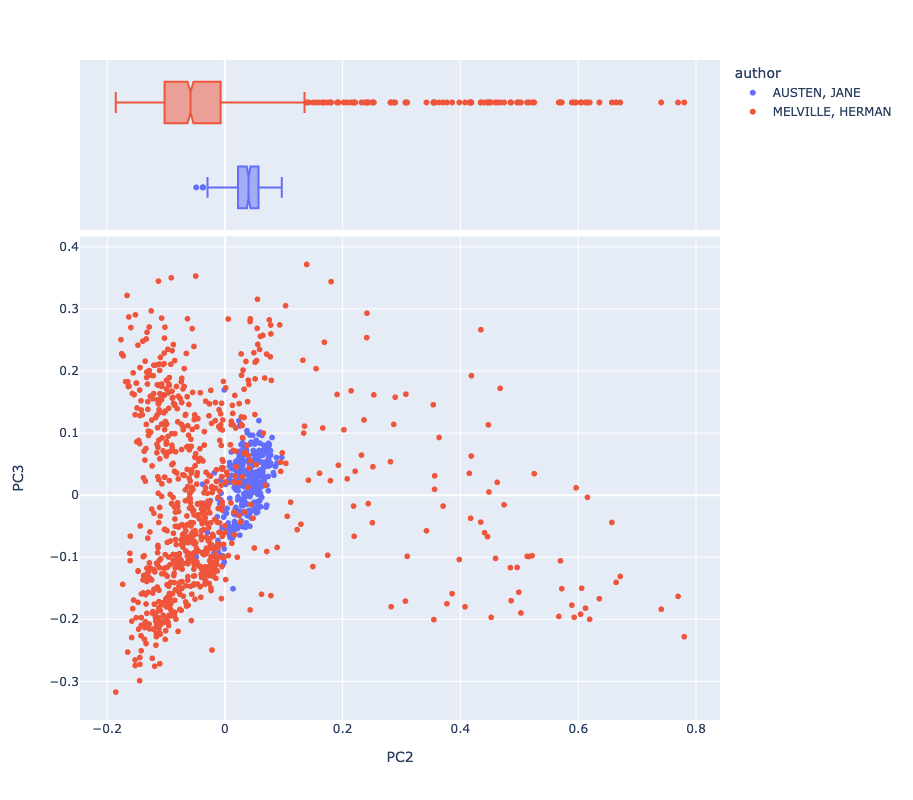

In [92]:
vis_pcs(DCM_sk, 2, 3)

In [93]:
# px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='author', hover_name='doc', height=1000, width=1200)

In [94]:
# px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='mode', hover_name='doc', hover_data=['genre'], symbol='author', height=1000, width=1200)

## Get Loadings

In [95]:
LOADINGS_sk = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS_sk.columns = ["PC{}".format(i) for i in LOADINGS_sk.columns]

In [96]:
LOADINGS_sk.index = TFIDF_L2.columns
LOADINGS_sk.index.name = 'term_str'

In [97]:
LOADINGS.sort_values('PC0').head(10)

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
sister,-0.155442,-0.027802,0.052310,-0.061301,0.000470,0.029978,-0.044082,-0.063749,-0.015037,-0.002962
dear,-0.147109,-0.015847,0.048250,-0.048198,0.028275,-0.037007,0.028481,-0.047649,0.004893,0.007892
think,-0.122512,0.013409,0.039271,-0.056714,-0.032311,-0.109834,0.010934,-0.007094,-0.009144,0.007240
mother,-0.117635,-0.054288,0.034400,-0.030721,0.034631,0.106116,-0.061288,-0.017430,0.075968,0.103619
letter,-0.116974,-0.014229,0.052488,-0.039240,0.055454,0.046484,-0.021786,-0.108231,-0.043692,0.031447
wish,-0.104451,0.011525,0.033492,-0.028293,-0.011592,-0.022479,0.006249,-0.028168,-0.007732,-0.037953
father,-0.101859,-0.014276,0.022038,-0.031703,0.001988,0.019177,-0.060737,-0.006400,0.028844,0.074835
room,-0.099114,-0.005361,0.010080,-0.089469,-0.066746,-0.042693,0.001347,0.126929,0.122819,-0.039021
family,-0.098565,0.014852,0.023693,-0.015478,-0.003096,0.012344,-0.045480,-0.020768,-0.035235,-0.014236


In [98]:
# LOADINGS_sk['term_str'] = LOADINGS_sk.apply(lambda x: VOCAB.loc[x.name], 1)

In [99]:
top_terms_sk= {}
for i in [0, 1]:
    for j in [0, 1]:
      top_terms_sk[f"{i}_{j}"] = ' '.join(LOADINGS_sk.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())

In [100]:
top_terms_sk

{'0_0': 'sister dear think mother letter wish father room family happy',
 '0_1': 'whale ship sea thou deck boat ye whales thee thy',
 '1_0': 'thou thee thy art ye oh sweet lord brother mother',
 '1_1': 'ship whale deck boat mate ships sea war crew board'}

# SAVE

In [101]:
TFIDF.to_csv(f"{output_dir}/{data_prefix}-TFIDF_chap.csv")
TFIDF_L2.to_csv(f"{output_dir}/{data_prefix}-TFIDF_chap_L2.csv")
DCM.iloc[:,:10].to_csv(f"{output_dir}/{data_prefix}-PCA_DCM_chap.csv")
COMPS.iloc[:,[0,-1]].to_csv(f"{output_dir}/{data_prefix}-PCA_COMPS_chap.csv")
LOADINGS.to_csv(f"{output_dir}/{data_prefix}-PCA_TCM.csv")